## System 6: Visualization and Analysis

This system enables the visualization and analysis of 400Hz data outputted by System 5.

**Inputs:**

- `5c` (one or multiple CSVs): Operations with emissions metadata. Multiple CSVs will be merged together and de-duplicated such that no operation repeats.

**Output:**

- See annotated visualizations and analysis below.

In [2]:
# Dependencies

# For any missing libraries, just run (remove curly braces):
# !pip install {library_name}
 
## Required
import pandas as pd
import numpy as np
import seaborn as sns
from tqdm import tqdm_notebook as tqdm
import datetime as dt

import matplotlib
matplotlib.use('nbagg')
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#from prettytable import PrettyTable

import random

In [3]:
# Input files in list form
# Each item in the array should be a string with a valid path to a CSV

input_5c_locations = [
    'sample_data/5c_all_operations_with_all_emissions_metadata.csv',
    'sample_data/5c_all_operations_with_all_emissions_metadata_more_data.csv', # Output from another run of the system, with more data
    ]

# Setup and Basic Statistics of Dataset

In [4]:
# Bring in operations with emissions totlas from from System 5
date_like = ['Real_Timestamp', 'Actual Landing Time (Aerobahn)', 
             'Scheduled In Block Time (Aerobahn)',
             'Scheduled Off Block Time (Aerobahn)',
             'in_block_time_dt',
             'off_block_time_dt', 
             'Row_Time_Delta']

# Choose columns to group by to define an operation
# This will be used in de-duplication if multiple data sources have the same operation
de_dup_cols = ['Gate', 'Actual Landing Time (Aerobahn)', 'Registration', 'Real_Timestamp']

print("Attempting to import %d CSVs" % len(input_5c_locations))

dfs = []
for file_path in input_5c_locations:
    df = pd.read_csv(file_path, parse_dates=date_like, infer_datetime_format=True)
    op_count = df['op_id'].nunique()
    print("Bringing in %s with %d rows and %d operations" % (file_path, len(df), op_count))
    # Row time delta handling, conversion to NS
    df['Row_Time_Delta'] = pd.to_timedelta(df['Row_Time_Delta']) # Force Time Delta column type
    df['Source_CSV'] = file_path
    dfs.append(df)
    
concatenated_dfs = pd.concat(dfs, sort=False)
print("Concatenated data frame has %d rows before de-duplication" % len(concatenated_dfs))
data = concatenated_dfs.drop_duplicates(subset=de_dup_cols, keep="first")

# Group rows that represent a single operation together, and define an op_id column
group_vars = ['Gate', 'Actual Landing Time (Aerobahn)', 'Registration'] # Choose columns to group by to define an operation
data['op_id'] = data.groupby(group_vars).ngroup() # Define a unique op id (unique in the space of this dataset)
data.reset_index(drop=True, inplace=True)
op_count = data['op_id'].nunique()

# Setting up a dataframe that just contains the first values in each column for each operation
# Must only be used for columns that have the same value throughout each operation (i.e. aggregated cols, gate, etc.)
operations_grouped = data.groupby("op_id").first()

print("De-duplicated data frame has %d rows and %d operations." % (len(data), op_count))

Attempting to import 2 CSVs
Bringing in sample_data/5c_all_operations_with_all_emissions_metadata.csv with 88277 rows and 4761 operations
Bringing in sample_data/5c_all_operations_with_all_emissions_metadata_more_data.csv with 319427 rows and 17984 operations
Concatenated data frame has 407704 rows before de-duplication
De-duplicated data frame has 407704 rows and 22745 operations.


In [4]:
# List of all gates represented in data
print("Gates represented in this dataset, with corresponding number of rows (desc.)")
with pd.option_context("display.max_rows", 100):
    display(data['Gate'].value_counts())

Gates represented in this dataset, with corresponding number of rows (desc.)


Gate_F79     15706
Gate_F77B    15580
Gate_E68     15017
Gate_E69     14780
Gate_E65     14592
Gate_E60     14459
Gate_F71B    14088
Gate_E61     14031
Gate_E62     13922
Gate_E64     12831
Gate_F70     12515
Gate_F71A    12441
Gate_E67     12422
Gate_E66     11193
Gate_A1      10823
Gate_E63     10548
Gate_D54B     9861
Gate_D53      9149
Gate_D55      9120
Gate_G92      9081
Gate_D50A     8470
Gate_D52      8369
Gate_D56A     8131
Gate_D54A     7731
Gate_D51B     7619
Gate_A12      7526
Gate_D50B     7379
Gate_D58A     7272
Gate_D51A     7241
Gate_A10      6960
Gate_D56B     6956
Gate_G91      6902
Gate_G96      6811
Gate_G94      6790
Gate_D57      6613
Gate_G93      5232
Gate_G97      4709
Gate_G98      4296
Gate_G100     4273
Gate_G95      4099
Gate_D58B     3950
Gate_A7       3774
Gate_A2       2827
Gate_A9       2564
Gate_A4       2324
Gate_A6       1752
Gate_A8       1444
Gate_A5       1398
Gate_A3        994
Gate_D59       871
Gate_A11A      236
Gate_A1B        32
Name: Gate, 

In [5]:
# Aircraft models represented in this dataset
print("Aircraft Models represented in this dataset, with corresponding number of rows (desc.)")
with pd.option_context("display.max_rows", 100):
    display(data['Model'].value_counts())

Aircraft Models represented in this dataset, with corresponding number of rows (desc.)


E75     63860
37K     62781
A320    37218
A321    37131
20S     26339
73Q     24193
73Y     20305
B738    19181
B739    15734
78Z     14128
19S     11151
E75L     7984
B789     7788
CRJ      6896
77X      6411
A319     6005
A21N     4722
B77W     4005
CRJ9     3667
77U      3509
77N      2656
B737     2635
19C      2023
A359     1998
78V      1819
B788     1587
CR7      1543
A332     1528
75B      1361
77Q      1112
75E       792
B763      532
75K       518
B744      494
20C       468
77M       404
A20N      385
B752      364
73R       309
B736      262
73C       211
A388      189
77G       186
77W       165
B772      153
328       150
73H       149
A333      131
77J       101
19F        86
320        77
319        56
321        50
A343       41
MD83       37
739        29
19G        26
78J        18
B77L       17
3SE        13
77E        12
77Y         9
Name: Model, dtype: int64

In [6]:
# Airlines represented in this dataset
print("Airlines represented in this dataset, with corresponding number of rows (desc.)")
with pd.option_context("display.max_rows", 100):
    display(data['Carrier Group'].value_counts())

Airlines represented in this dataset, with corresponding number of rows (desc.)


United Airlines      239270
Alaska Airlines       77015
American Airlines     31666
Air Canada            15132
Jet Blue              13395
Other                 11143
Delta Air Lines        9592
Frontier Airlines      4191
Signature              3870
Pacific Aviation       2430
Name: Carrier Group, dtype: int64

In [7]:
# Airplane Design Group (ADG)s represented in this dataset
print("Airplane Design Group (ADG) represented in this dataset, with corresponding number of rows (desc.)")
with pd.option_context("display.max_rows", 100):
    display(data['ADG'].value_counts())

Airplane Design Group (ADG) represented in this dataset, with corresponding number of rows (desc.)


III    341232
V       48272
IV       9572
II       8439
VI        189
Name: ADG, dtype: int64

# Single Operation Visualization

In [8]:
# Here we define our function that lets the user plot an operation by a given ID, with a ton of metadata
#
# Feel free to scroll right past this, but notice there are toggles that let you control which Y-Axis vectors are
# shown. This can produce cleaner graphs if you just wanted to, for example, look at only real, not predicted, values.
def plot_by_op_id(data, 
                  op_id, 
                  show_power=True,
                  show_plane_in_ratio=True,
                  show_threshold=True,
                  show_predicted=True,
                  show_ratio_400hz=True,
                  show_ratio_APU=True):
    fig = make_subplots(specs=[[{"secondary_y": True}]])

    one_slice = data[data['op_id'] == op_id]
    
    total_real = 0
    total_400hz = 0
    total_APU = 0
    
    for item, row in one_slice.iterrows():
        row_time_in_hours = (int(row['Row_Time_Delta_ns']) / 60000000000) / 60
        total_real += row['Power_kW'] * row_time_in_hours
        total_400hz += row['prediction'] * row['ratio_400hz'] * row_time_in_hours
        total_APU += row['prediction'] * row['ratio_APU'] * row_time_in_hours
    
    total_pred = total_400hz + total_APU
    total_pred_ratio = 0
    if (total_real != 0):
        total_pred_ratio = (total_real - total_400hz) / total_real
        
    X = one_slice['Real_Timestamp']
    Y1 = one_slice['Power_kW']
    Y2 = one_slice['plane_in_ratio']
    Y3 = one_slice['ratio_400hz']
    Y4 = one_slice['ratio_APU']
    Y5 = one_slice['threshold']
    Y6 = one_slice['prediction']
    
    colors = px.colors.DEFAULT_PLOTLY_COLORS
    
    if show_power:
        fig.add_trace(
             go.Scatter(x=X, y=Y1, name="Power (kW)", line=dict(width=3, color='blue')), # fill='tozeroy',
            secondary_y=False,
        ) 
        
    if show_plane_in_ratio:    
        fig.add_trace(
            go.Scatter(x=X, y=Y2, name="Plane in Gate Ratio", line=dict(width=3, dash='dot', color='purple')),
            secondary_y=True,
        )

    if show_threshold:
        fig.add_trace(
            go.Scatter(x=X, y=Y5, name="threshold", line=dict(width=4, color='red')), #, dash='dot')),
            secondary_y=False,
        )        
    
    if show_predicted:        
        fig.add_trace(
            go.Scatter(x=X, y=Y6, name="Predicted Power (kW)", line=dict(width=3, color='green')),
            secondary_y=False,
        )        
    
    if show_ratio_400hz:
        fig.add_trace(
            go.Scatter(x=X, y=Y3, name="ratio_400hz", line=dict(width=4, dash='dot', color='orange')),
            secondary_y=True,
        )
    
    if show_ratio_APU:
        fig.add_trace(
            go.Scatter(x=X, y=Y4, name="ratio_APU", line=dict(width=4, dash='dot', color='light blue')),
            secondary_y=True,
        )    
      
    fig.update_layout(
        title_text="Op ID %s: Carrier: %s, Registration: %s, Subtype: %s at %s" % (op_id, one_slice['Carrier Group'].iloc[0], one_slice['Registration'].iloc[0], one_slice['Model'].iloc[0], one_slice['Gate'].iloc[0])
    )

    fig.update_xaxes(title_text="Time <br><br> <b>Total 400Hz Time</b>: %.2f mins, <b>Total APU Time</b>: %.2f mins" % (one_slice['total_time_400hz'].iloc[0], one_slice['total_time_APU'].iloc[0]))
    
    if show_threshold:
        fig.update_yaxes(title_text="<b>Power (kW), Threshold</b>", secondary_y=False)
    else:
        fig.update_yaxes(title_text="<b>Power (kW)", secondary_y=False)
    
    if show_ratio_400hz and show_ratio_APU:  
        fig.update_yaxes(title_text="<b>Plane in Gate Ratio, 400Hz Ratio, APU Ratio</b>", secondary_y=True)
    else:
        fig.update_yaxes(title_text="<b>Plane in Gate Ratio</b>", secondary_y=True)
    fig.show()

    t = PrettyTable(['Power Prediction Data', 'Value'])
    t.add_row(['Total Real Energy (KWh)', '%s' % float('%.4g' % total_real)])
    t.add_row(['Total 400Hz Energy Predicted (kWh)', '%s' % float('%.4g' % total_400hz)])
    t.add_row(['Total APU Energy Predicted (kWh)', '%s'% float('%.4g' % total_APU)])
    t.add_row(['Grand Total Energy Predicted (kWh)', '%s' % float('%.4g' % total_pred)])
    t.add_row(['400Hz Prediction Percentage Diff (0 is ideal)', '%s' % float('%.4g' % total_pred_ratio)])
    print(t)
    
    first_row = one_slice.iloc[0]
    t = PrettyTable(['Emission Type', 'APU Start Total (kg)', 'APU Normal Total (kg)', 'APU Grand Total (kg)'])
    cats = ['NOx', 'NO2', 'CO', 'HC', 'PM', 'Fuel']
    for cat in cats:
        normal_total_col = "Normal " + cat + " (kg)_total"
        start_total_col = "Start " + cat + " (kg)_total"
        grand_total_col = cat + " (kg)_grandtotal"
        normal_total = '%s' % float('%.2g' % first_row[normal_total_col])
        start_total = '%s' % float('%.2g' % first_row[start_total_col])
        grand_total = '%s' % float('%.2g' % first_row[grand_total_col])
        t.add_row([cat, start_total, normal_total, grand_total])
    print(t)

In [9]:
# Single Operation Visualization Tool, with Consumption, Predicted APU Values, and Emissions Metadata

plot_by_op_id(data, random.randint(0, op_count)) 

# To plot multiple operations at once, change the variable below to a number of your choice
num_ops_to_plot = 0
for i in np.random.randint(op_count, size=num_ops_to_plot):
    display(plot_by_op_id(data, i))

+-----------------------------------------------+-------+
|             Power Prediction Data             | Value |
+-----------------------------------------------+-------+
|            Total Real Energy (KWh)            | 18.28 |
|       Total 400Hz Energy Predicted (kWh)      | 16.16 |
|        Total APU Energy Predicted (kWh)       |  6.16 |
|       Grand Total Energy Predicted (kWh)      | 22.32 |
| 400Hz Prediction Percentage Diff (0 is ideal) | 0.116 |
+-----------------------------------------------+-------+
+---------------+----------------------+-----------------------+----------------------+
| Emission Type | APU Start Total (kg) | APU Normal Total (kg) | APU Grand Total (kg) |
+---------------+----------------------+-----------------------+----------------------+
|      NOx      |        0.036         |          0.27         |         0.3          |
|      NO2      |        0.012         |         0.091         |         0.1          |
|       CO      |         0.37        

# Consumption Patterns by Gate & Aircraft Type

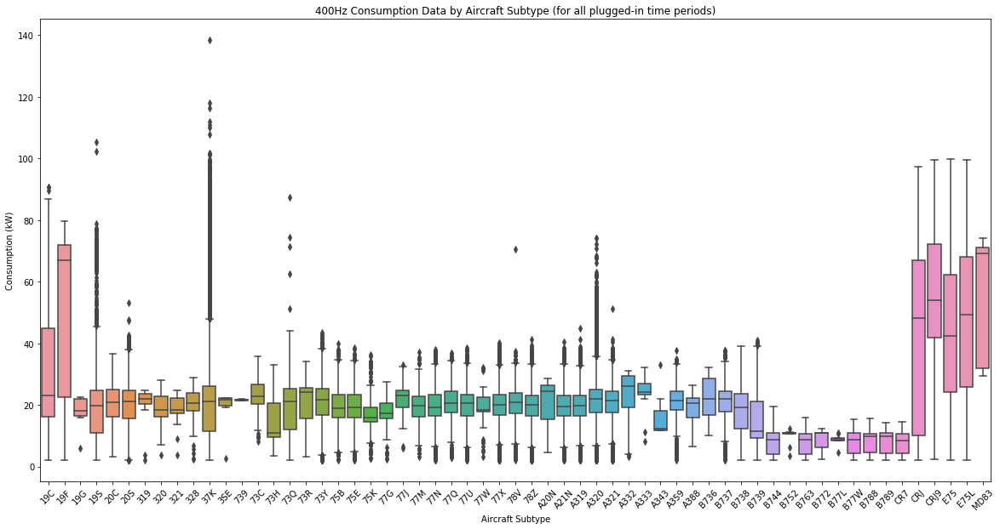

In [10]:
# Box whisker of consumption by aircraft subtypes
data_with_gate_in = data[data['>threshold'] == True]

plt.figure(figsize=(20,10))
p=sns.boxplot(sorted(data_with_gate_in['Model']), data_with_gate_in['Power_kW']);
p.set_xticklabels(p.get_xticklabels(),rotation=45);
plt.ylabel('Consumption (kW)')
plt.xlabel('Aircraft Subtype')
plt.title('400Hz Consumption Data by Aircraft Subtype (for all plugged-in time periods)');

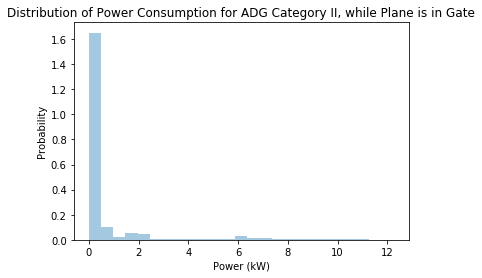

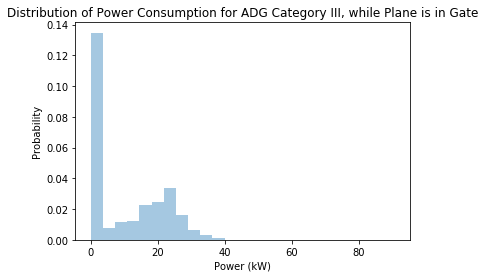

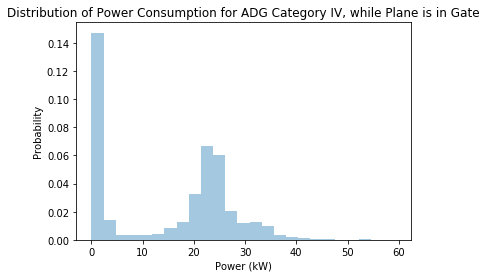

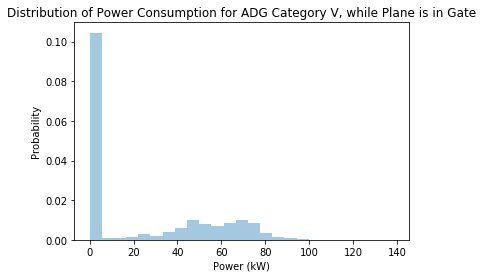

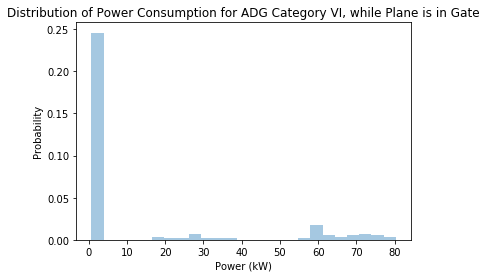

In [11]:
# Consumption distributions per Airplane Design Group

design_categories = data['ADG'].unique()
design_categories.sort()
for _, category in enumerate(design_categories):
    ax = sns.distplot(data.loc[(data['ADG'] == category) & (data['plane_in_ratio'] == 1.0) & (data['Power_kW'] >= 0), 'Power_kW'], kde=False, norm_hist=True, bins = 25)
    ax.set(xlabel='Power (kW)', ylabel='Probability', title='Distribution of Power Consumption for ADG Category %s, while Plane is in Gate' % (category)) 
    plt.show()

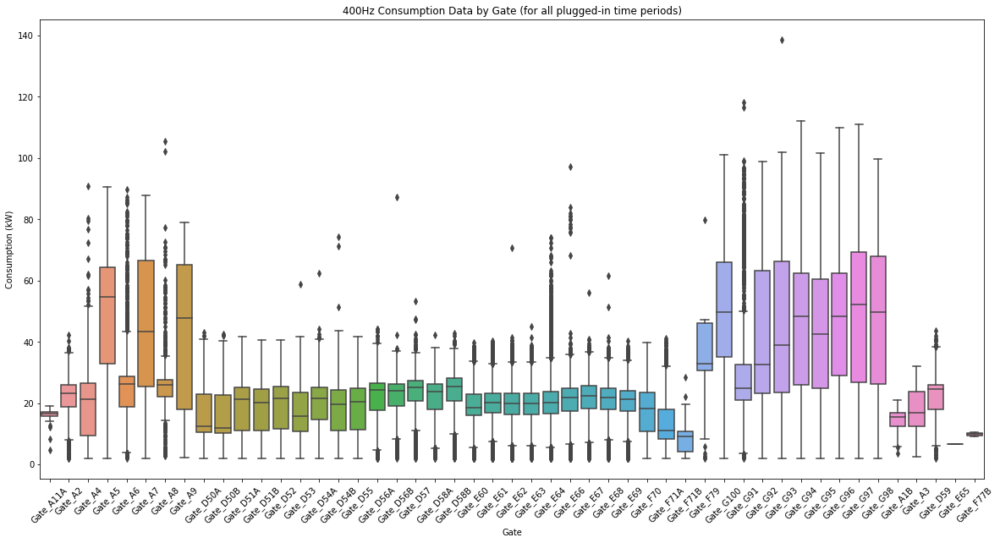

In [12]:
# Consumption by Gate 
data_with_gate_in = data[data['>threshold'] == True]
plt.figure(figsize=(20,10))
p=sns.boxplot(data_with_gate_in['Gate'], data_with_gate_in['Power_kW']);
p.set_xticklabels(p.get_xticklabels(),rotation=45);
plt.ylabel('Consumption (kW)')
plt.xlabel('Gate')
plt.title('400Hz Consumption Data by Gate (for all plugged-in time periods)');

/Users/chanan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



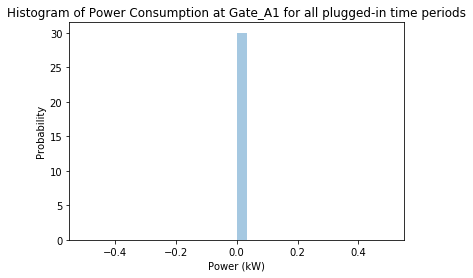

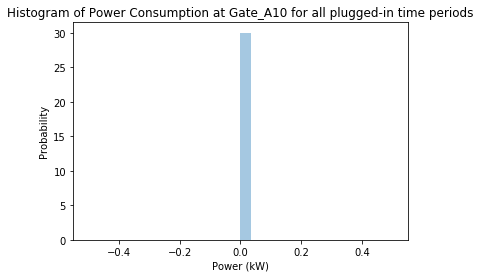

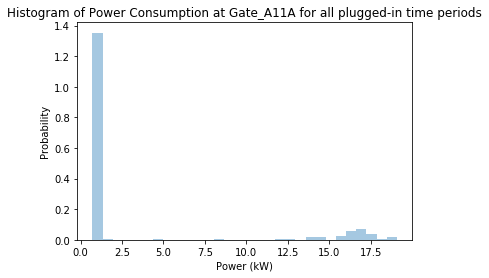

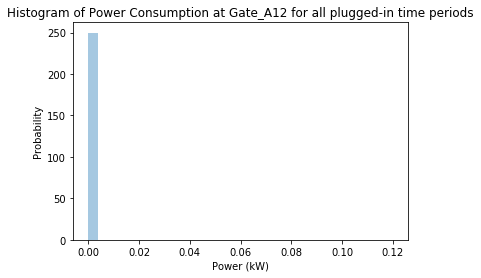

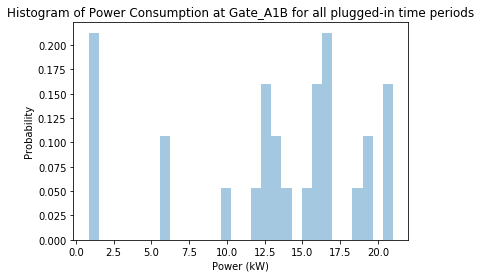

...

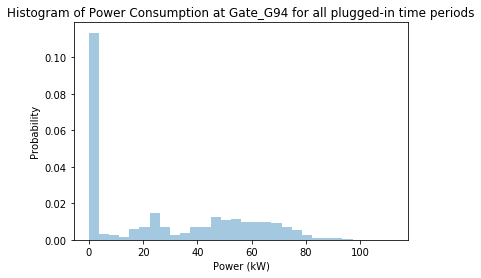

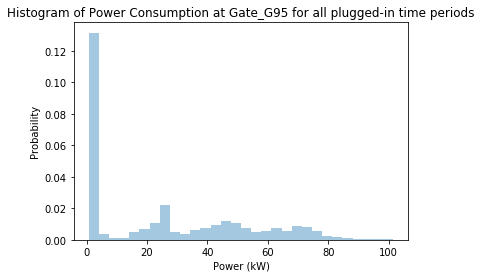

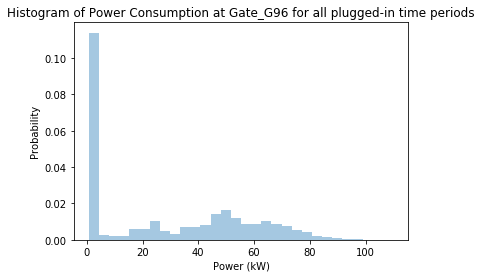

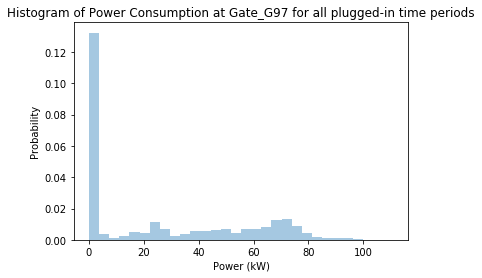

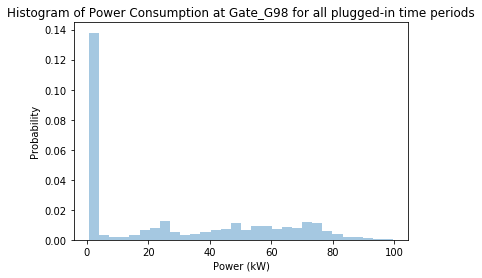

In [13]:
# Consumption Distributions for All Gates

gates = data['Gate'].unique()
gates.sort()
for gate in gates:
    plt.figure()
    sns.distplot(data[(data['Gate'] == gate) & (data['plane_in_ratio'] == 1) & (data['Power_kW'] >= 0)]['Power_kW'], kde=False, bins=30, norm_hist=True, hist=True)
    plt.title('Histogram of Power Consumption at %s for all plugged-in time periods' % gate)
    plt.xlabel('Power (kW)')
    plt.ylabel('Probability')

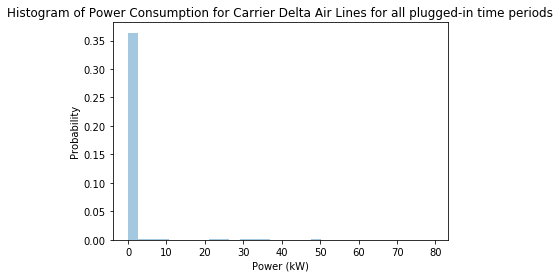

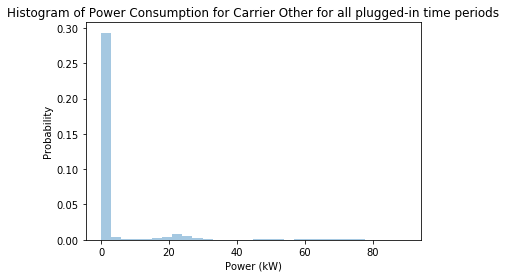

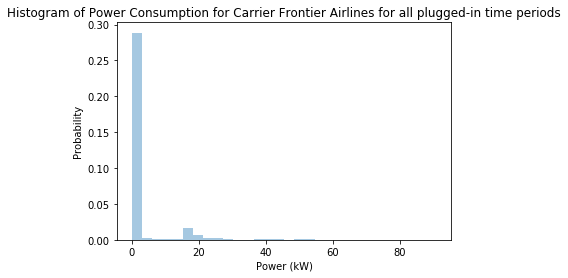

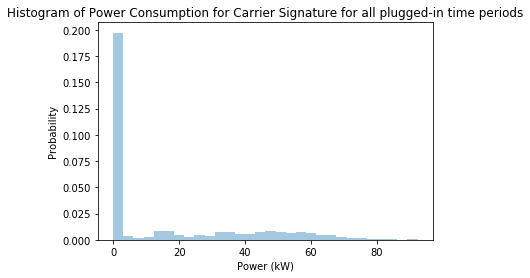

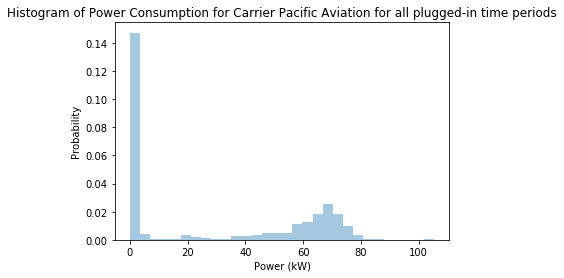

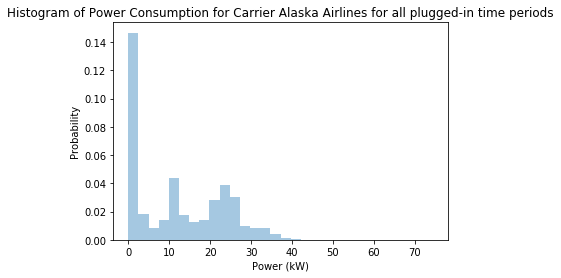

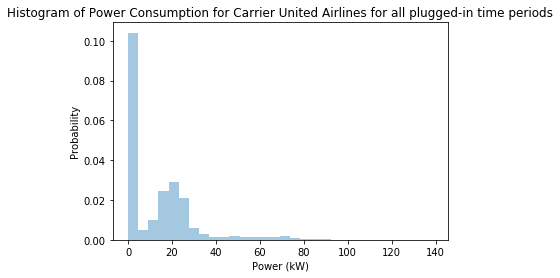

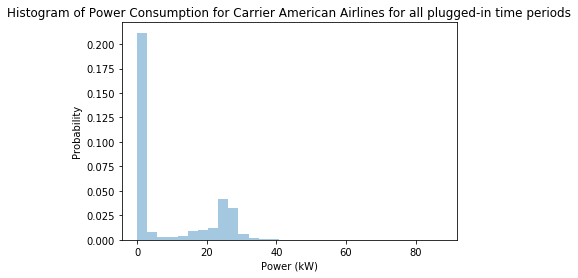

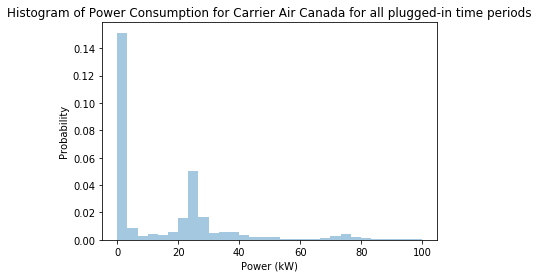

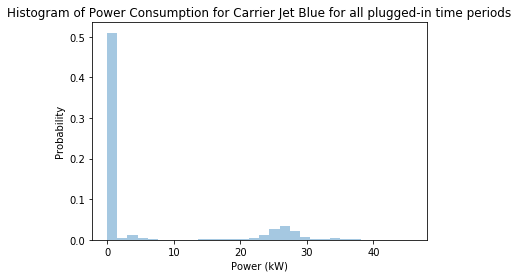

In [14]:
# Consumption Distributions for All Airlines
carriers = data['Carrier Group'].unique()
num_rows = data['Carrier Group'].value_counts()
for carrier in carriers:
    if num_rows[carrier] < 1000:
        continue
    plt.figure()
    sns.distplot(data[(data['Carrier Group'] == carrier) & (data['plane_in_ratio'] == 1) & (data['Power_kW'] >= 0)]['Power_kW'], kde=False, bins=30, norm_hist=True, hist=True)
    plt.title('Histogram of Power Consumption for Carrier %s for all plugged-in time periods' % carrier)
    plt.xlabel('Power (kW)')
    plt.ylabel('Probability')

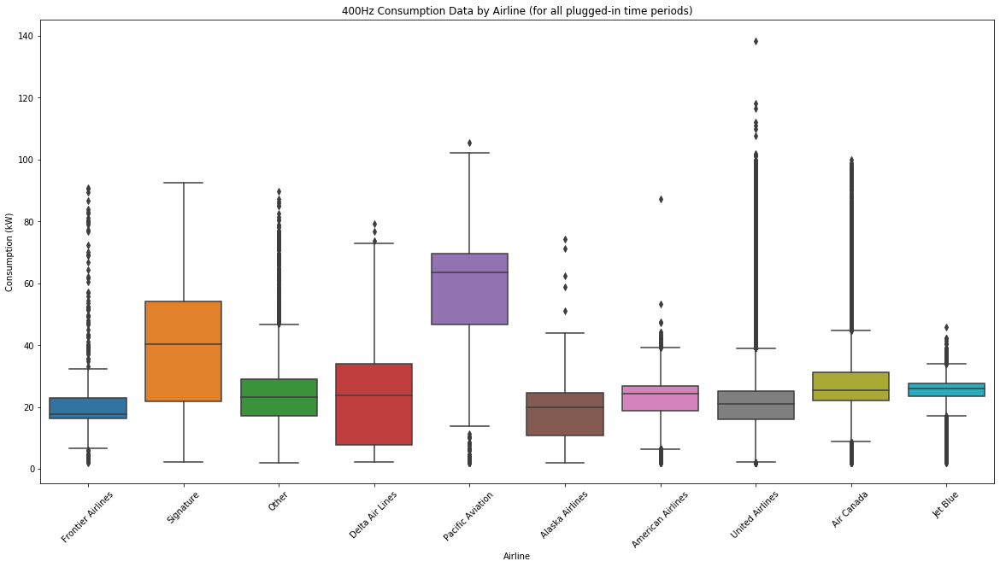

In [15]:
# Box and Whisker Plot of Consumption Power per Airline 
data_with_gate_in = data[data['>threshold'] == True]

plt.figure(figsize=(20,10))
p=sns.boxplot(data_with_gate_in['Carrier Group'],data_with_gate_in['Power_kW']);
p.set_xticklabels(p.get_xticklabels(),rotation=45);
plt.ylabel('Consumption (kW)')
plt.xlabel('Airline')
plt.title('400Hz Consumption Data by Airline (for all plugged-in time periods)');

# Analysis of Operational Success

In [16]:
# Operation Success Across Dataset

fig =  px.histogram(operations_grouped, x="ratio_successful", histnorm='probability') #, color='ADG')
avg = np.mean(operations_grouped['ratio_successful'])

# Add figure title
fig.update_layout(
    title_text="Distribution of Operation Success Across Dataset (0 is failed, 1 is 100% 400Hz Utilization)"
)

# Set axes title
fig.update_xaxes(title_text="Ratio of Operation Success <br><br><b>Average Success Ratio: %.2f</b>" % avg)
fig.update_yaxes(title_text="Probability")

fig.show()

In [17]:
# Operational Success by Airline
carriers = data['Carrier Group'].unique()
num_rows = data['Carrier Group'].value_counts()
for carrier in carriers:
    if num_rows[carrier] < 1000:
        continue
        
    this_carrier = operations_grouped[operations_grouped['Carrier Group'] == carrier]
    avg = np.mean(this_carrier['ratio_successful'])
        
    fig =  px.histogram(this_carrier, x="ratio_successful", histnorm='probability') #, color='ADG')

    # Add figure title
    fig.update_layout(
        title={
        'text': "Airline: <b>%s</b> <br> Distribution of Operation Success (0 is failed, 1 is 100%% 400Hz Utilization)" % (carrier),
        'x':0.5,
        'xanchor': 'center',
        } 
    )

    # Set axes title
    fig.update_xaxes(title_text="Ratio of Operation Success <br><b>Average Success Ratio: %.2f</b>" % avg)
    fig.update_yaxes(title_text="Probability")

    fig.show()

In [18]:
# Operational Success by Airplane Design Group (ADG)

design_categories = data['ADG'].unique()
design_categories.sort()
for category in design_categories:
    this_category = operations_grouped[operations_grouped['ADG'] == category]
    avg = np.mean(this_category['ratio_successful'])
    
    fig =  px.histogram(this_category, x="ratio_successful", histnorm='probability')

    fig.update_layout(
        title={
            'text': "Airplane Design Group (ADG): <b>%s</b> <br> Distribution of Operation Success (0 is failed, 1 is 100%% 400Hz Utilization)" % (category),
            'x':0.5,
            'xanchor': 'center',
        } 
    )

    fig.update_xaxes(title_text="Ratio of Operation Success <br><br><b>Average Success Ratio: %.2f</b>" % avg)
    fig.update_yaxes(title_text="Probability")

    fig.show()

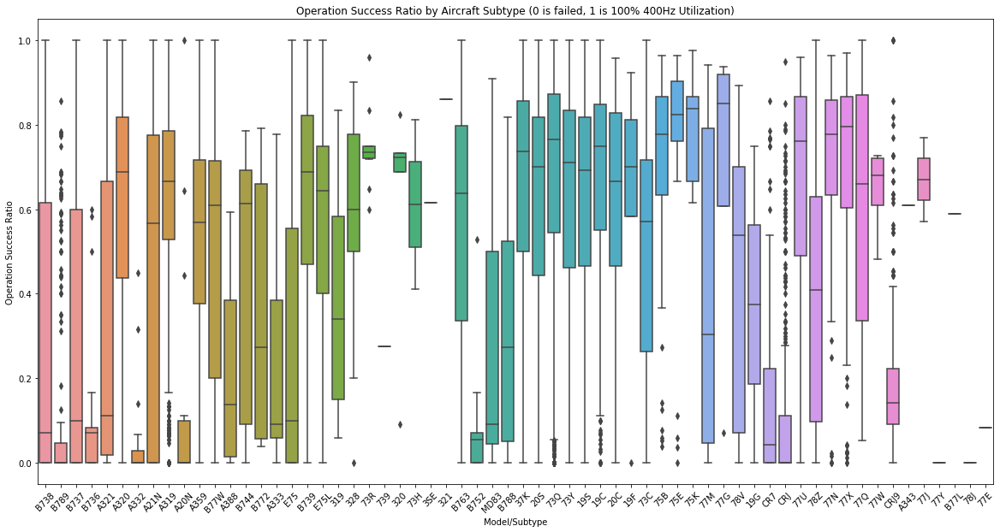

In [19]:
# Operational Success by Aircraft Subtype

plt.figure(figsize=(20,10))
p=sns.boxplot(operations_grouped['Model'],operations_grouped['ratio_successful']);
p.set_xticklabels(p.get_xticklabels(),rotation=45);
plt.ylabel('Operation Success Ratio')
plt.xlabel('Model/Subtype')
plt.title('Operation Success Ratio by Aircraft Subtype (0 is failed, 1 is 100% 400Hz Utilization)');

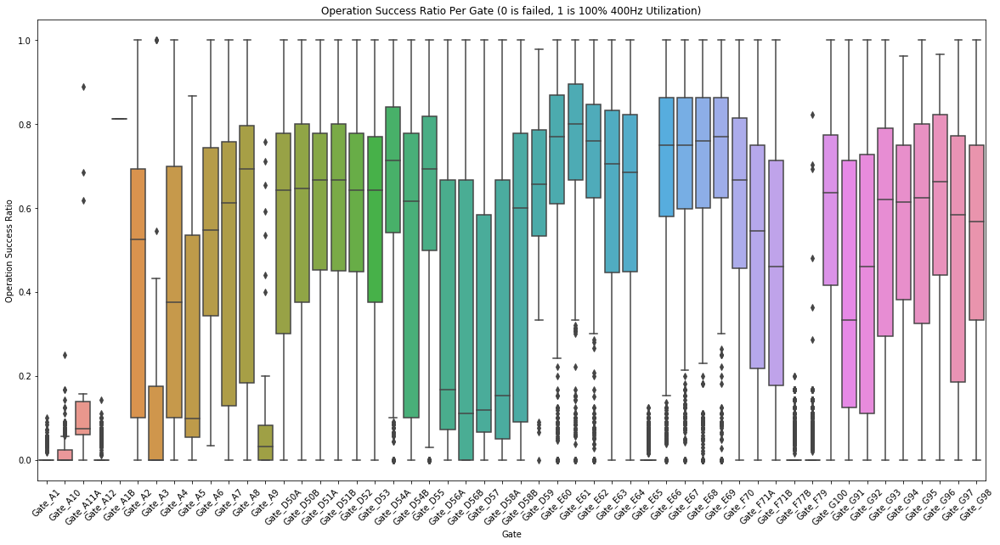

In [20]:
# Operational Success by Gate

plt.figure(figsize=(20,10))
p=sns.boxplot(operations_grouped['Gate'],operations_grouped['ratio_successful']);
p.set_xticklabels(p.get_xticklabels(),rotation=45);
plt.ylabel('Operation Success Ratio')
plt.xlabel('Gate')
plt.title('Operation Success Ratio Per Gate (0 is failed, 1 is 100% 400Hz Utilization)');

# APU Time Analysis

In [21]:
# Distribution of APU Time Across Entire Dataset

fig =  px.histogram(operations_grouped, x="total_time_APU", histnorm='probability') #, color='ADG')
avg = np.mean(operations_grouped['total_time_APU'])

# Add figure title
fig.update_layout(
    title_text="Distribution of Total APU Time Per Operation"
)

# Set axes title
fig.update_xaxes(title_text="Total APU Time per Operation <br><br><b>Average Time: %.2fm</b>" % avg)
fig.update_yaxes(title_text="Probability")

fig.show()

In [22]:
# APU Time by Airline
carriers = data['Carrier Group'].unique()
num_rows = data['Carrier Group'].value_counts()

for carrier in carriers:
    if num_rows[carrier] < 1000:
        continue
        
    this_carrier = operations_grouped[operations_grouped['Carrier Group'] == carrier]
    avg = np.mean(this_carrier['total_time_APU'])
        
    fig =  px.histogram(this_carrier, x="total_time_APU", histnorm='probability') #, color='ADG')

    # Add figure title
    fig.update_layout(
        title={
        'text': "Airline: <b>%s</b> <br> Distribution of Total APU Time Per Operation" % (carrier),
        'x':0.5,
        'xanchor': 'center', 
        } 
    )

    # Set axes title
    fig.update_xaxes(title_text="Total APU Time per Operation <br><br><b>Average Time: %.2fm</b>" % avg)
    fig.update_yaxes(title_text="Probability")

    fig.show()

In [23]:
# APU time by ADG
design_categories = data['ADG'].unique()
design_categories.sort()

for category in design_categories:
    this_category = operations_grouped[operations_grouped['ADG'] == category]
    avg = np.mean(this_category['total_time_APU'])
        
    fig =  px.histogram(this_category, x="total_time_APU", histnorm='probability') #, color='ADG')

    # Add figure title
    fig.update_layout(
        title={
        'text': "Airplane Design Group (ADG): <b>%s</b> <br> Distribution of Total APU Time Per Operation" % (category),
        'x':0.5,
        'xanchor': 'center', 
        } 
    )

    # Set axes title
    fig.update_xaxes(title_text="Total APU Time per Operation <br><br><b>Average Time: %.2fm</b>" % avg)
    fig.update_yaxes(title_text="Probability")

    fig.show()


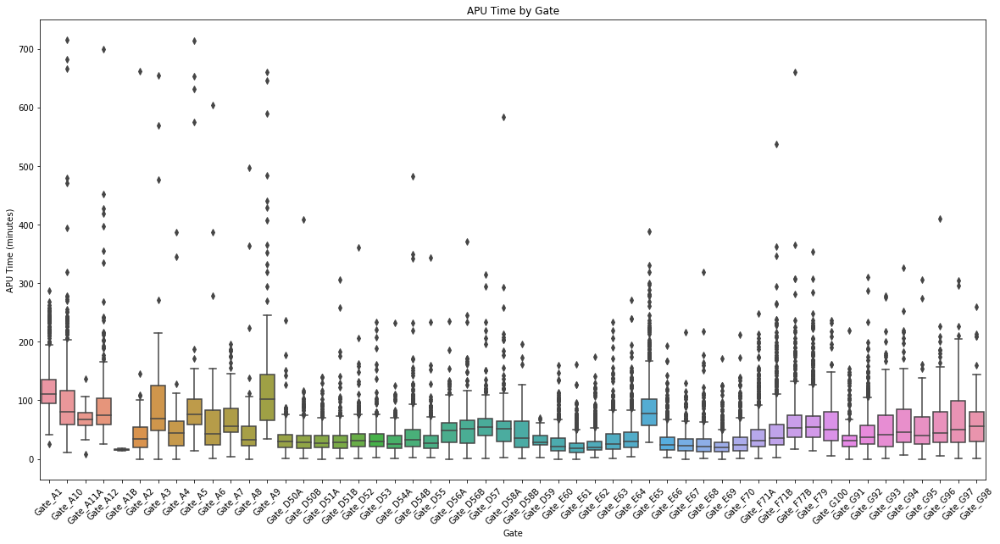

In [24]:
# APU Time by Gate

plt.figure(figsize=(20,10))
p=sns.boxplot(operations_grouped['Gate'],operations_grouped['total_time_APU']);
p.set_xticklabels(p.get_xticklabels(),rotation=45);
plt.ylabel('APU Time (minutes)')
plt.xlabel('Gate')
plt.title('APU Time by Gate');

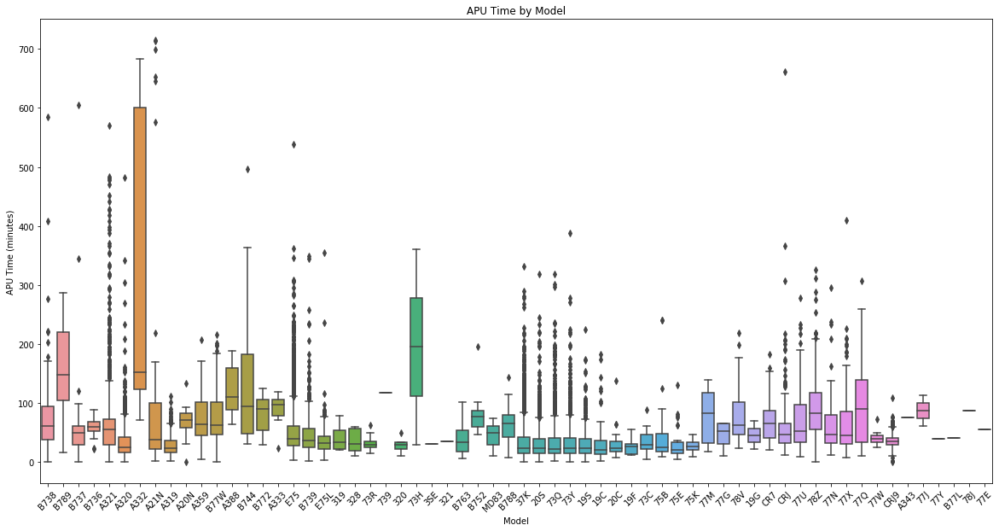

In [25]:
# APU Time by Aircraft Subtype

plt.figure(figsize=(20,10))
p=sns.boxplot(operations_grouped['Model'],operations_grouped['total_time_APU']);
p.set_xticklabels(p.get_xticklabels(),rotation=45);
plt.ylabel('APU Time (minutes)')
plt.xlabel('Model')
plt.title('APU Time by Model');

# Overall Emissions Analysis

In [26]:
sums = operations_grouped.sum()

print("Displaying emissions data across all operations across entire dataset")
t = PrettyTable(['Power Prediction Totals Across All Data', 'Value'])
t.add_row(['Total Real Energy (KWh)', '%s' % float('%.4g' % sums['Cumulative_kWh'])])
t.add_row(['Total 400Hz Energy Predicted (kWh)', '%s' % float('%.12g' % sums['op_total_400hz'])])
t.add_row(['Total APU Energy Predicted (kWh)', '%s'% float('%.12g' % sums['total_time_APU'])])
t.add_row(['Grand Total Energy Predicted (kWh)', '%s' % float('%.12g' % sums['op_total_pred'])])
print(t)

t = PrettyTable(['Emission Type', 'APU Start Total (kg)', 'APU Normal Total (kg)', 'APU Grand Total (kg)'])
cats = ['NOx', 'NO2', 'CO', 'HC', 'PM', 'Fuel']
for cat in cats:
    normal_total_col = "Normal " + cat + " (kg)_total"
    start_total_col = "Start " + cat + " (kg)_total"
    grand_total_col = cat + " (kg)_grandtotal"
    normal_total = '%s' % float('%.12g' % sums[normal_total_col])
    start_total = '%s' % float('%.12g' % sums[start_total_col])
    grand_total = '%s' % float('%.12g' % sums[grand_total_col])
    t.add_row([cat, start_total, normal_total, grand_total])
print(t)

Displaying emissions data across all operations across entire dataset
+-----------------------------------------+---------------+
| Power Prediction Totals Across All Data |     Value     |
+-----------------------------------------+---------------+
|         Total Real Energy (KWh)         |  9348000000.0 |
|    Total 400Hz Energy Predicted (kWh)   | 355782.206761 |
|     Total APU Energy Predicted (kWh)    | 1043104.87194 |
|    Grand Total Energy Predicted (kWh)   | 753428.346685 |
+-----------------------------------------+---------------+
+---------------+----------------------+-----------------------+----------------------+
| Emission Type | APU Start Total (kg) | APU Normal Total (kg) | APU Grand Total (kg) |
+---------------+----------------------+-----------------------+----------------------+
|      NOx      |      704.93595       |     14600.6166332     |    15305.5525832     |
|      NO2      |       240.5964       |     4993.35121308     |    5233.94761308     |
|       CO